# Advance Lane Finding
----
*Term 1, Project 4 of Udacity Self-Driving Car Nanodegree, by vuiseng9, August 2017*

 ![](sneakpeek.jpg)

The goal of this project is to devise an OpenCV pipeline that identifies the lane boundaries in a video from a front-facing camera on a vehicle. The requirement of the pipeline includes camera calibration, several video frame transformation and filtering techniques to extract the lane pixels, and eventually forming the assumed quardratic lane boundary equations. The output of the project are videos compiled from frame processed by the pipeline where detected lane will be marked in color and computed details are printed as well.

> [Final Project Video](www.youtube.com) and [Final Challenge Video](www.youtube.com)

This notebook presents the codes of the steps:

1. Camera Calibration
2. Distortion Correction
3. Color Space Transform and Masking
4. Transform from Single-point Perspective to Aerial view 
5. Lane Detection and Fitting
6. Lane Curvature and Vehicle Position
7. Warping lane boundaries and Final Visualization
8. Final Pipelines for project and challenge videos

In [5]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import random
import pandas as pd 
import matplotlib
import pickle
import os
from datetime import datetime
from tqdm import tqdm
matplotlib.rcParams['figure.figsize'] = (16, 9)
%matplotlib inline

---
#### 1. Camera Calibration
This step is to compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [6]:
def get_camMat_distCoeff(images):
    # forming corner coords in 3d world
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # setting up matplotlib axes
    cols = 4
    rows = np.ceil(len(images)/cols).astype('int')
    f, ax = plt.subplots(rows, cols, figsize=(cols*6, rows*4))
    
    # Step through the list of images and search for chessboard corners
    for i, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            r = int(i/cols)
            c = i%cols
            ax[r,c].imshow(img)
            ax[r,c].axis('off')
            ax[r,c].set_title(fname)
    
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = \
        cv2.calibrateCamera(objpoints, imgpoints, img.shape[::-1][1:],None,None)
    
    # save figure
    imgpth = 'output_images/detected_corners_on_chessboard_imgs.jpg'
    f.suptitle(imgpth)
    f.tight_layout()
    f.subplots_adjust(top=0.95)
    f.savefig(imgpth)
    
    # return only calibration matrix and distortion coefficient
    if ret:
        return mtx, dist

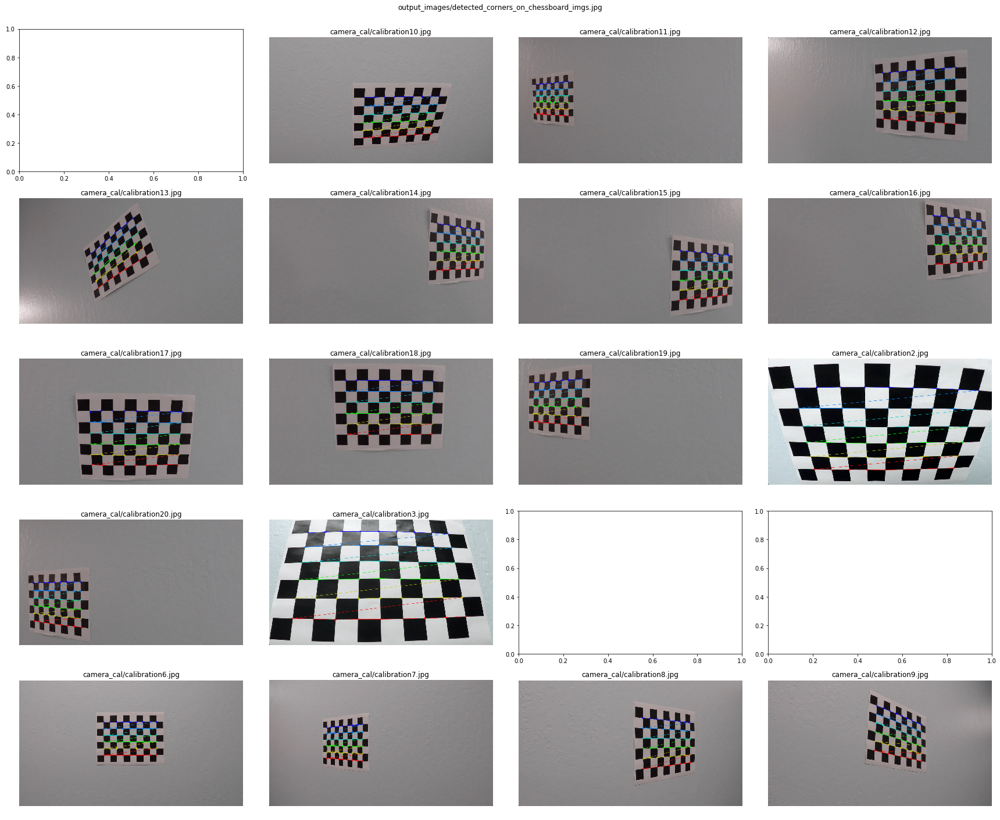

In [7]:
# Make a list of calibration images
images = sorted(glob.glob('camera_cal/calibration*.jpg'))
# Camera Calibration
mtx, dist = get_camMat_distCoeff(images)

# Save the camera calibration result for later use
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open( "cameraMatrix_distCoeffs.p", "wb" ))

---
#### 2. Distortion Correction
This section defines function to apply distortion correction using the ```mtx``` and ```dist``` computed above. Examples of function output are shown.

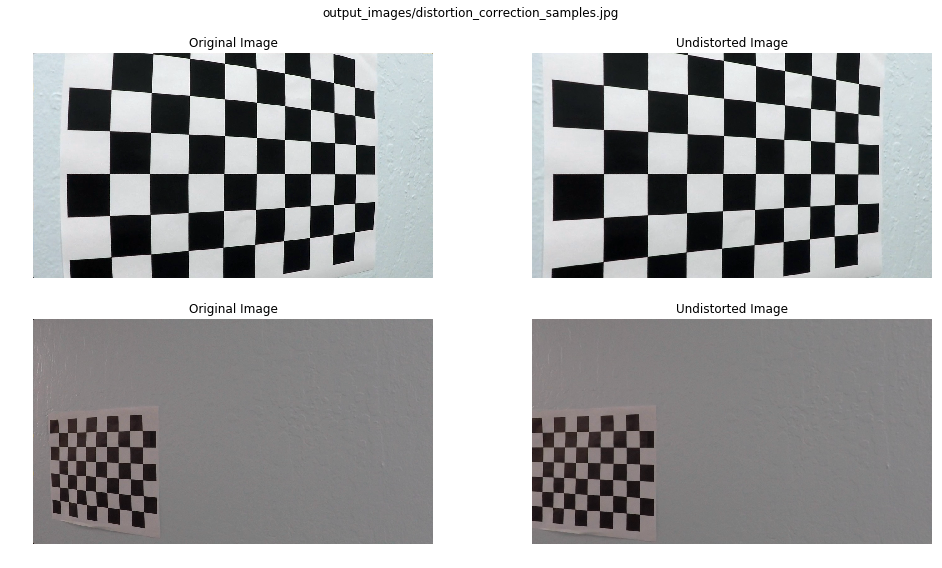

In [8]:
# Read in the saved camera matrix and distortion coefficients
dist_pickle = pickle.load( open( "cameraMatrix_distCoeffs.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Read in a sample image from the raw set
images = sorted(glob.glob('camera_cal/calibration*.jpg'))

img = cv2.imread(images[-5])
img2 = cv2.imread(images[-8])

# Apply undistortion to sample image 
# with the calibration parameters obtained above
undist = cv2.undistort(img, mtx, dist, None, mtx)
undist2 = cv2.undistort(img2, mtx, dist, None, mtx)

# Visualize undistortion
f, ax = plt.subplots(2, 2, figsize=(14,8)); ax
ax[0,0].imshow(img); ax[0,0].set_title('Original Image', fontsize=12); 
ax[0,1].imshow(undist); ax[0,1].set_title('Undistorted Image', fontsize=12)
ax[1,0].imshow(img2); ax[1,0].set_title('Original Image', fontsize=12)
ax[1,1].imshow(undist2); ax[1,1].set_title('Undistorted Image', fontsize=12)
ax[0,0].axis('off'); ax[0,1].axis('off'); ax[1,0].axis('off'); ax[1,1].axis('off')

# Save figure
imgpth = 'output_images/distortion_correction_samples.jpg'
f.suptitle(imgpth)
f.tight_layout()
f.subplots_adjust(top=0.9)
f.savefig(imgpth)

--- 
#### 3. Color Space Transform and Masking

Following cell is showing S-channel only thresholding is insufficient as shadow is likely to be retained and color boundary is able to give finer filtering.

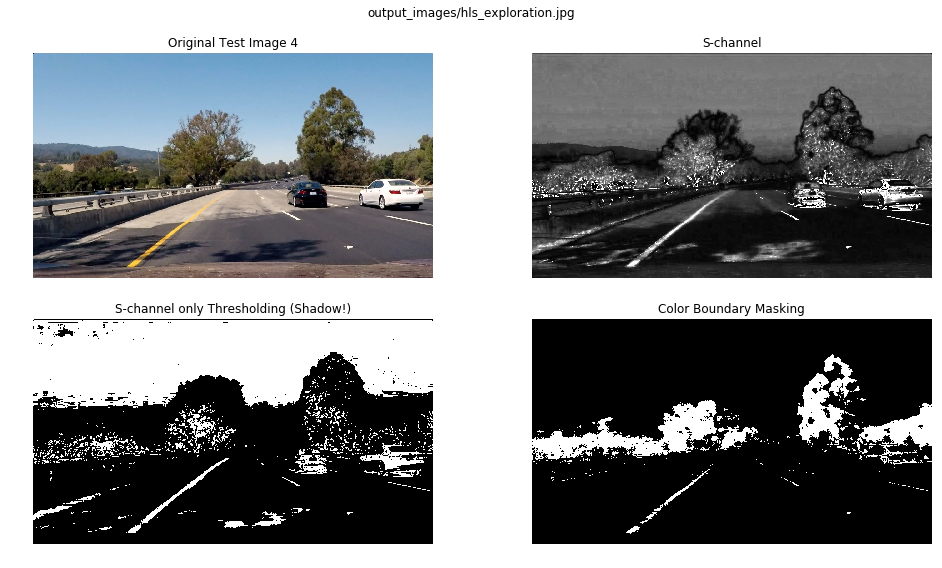

In [9]:
image = plt.imread('./test_images/test4.jpg')

# Transform from RGB to HLS color space
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

# s channel thresholding
s_binary = np.zeros_like(S)
s_binary[(S >= 110) & (S <= 255)] = 1

# Form yellow color limits
lower = np.array([20, 0, 40], dtype = "uint8")
upper = np.array([35, 255, 255], dtype = "uint8")
# masking using cv2.inRange function
mask = cv2.inRange(hls, lower, upper)

# Visualize undistortion
f, ax = plt.subplots(2, 2, figsize=(14,8));
ax[0,0].imshow(image); ax[0,0].set_title('Original Test Image 4', fontsize=12) 
ax[0,1].imshow(S, cmap='gray'); ax[0,1].set_title('S-channel', fontsize=12)
ax[1,0].imshow(s_binary, cmap='gray'); ax[1,0].set_title('S-channel only Thresholding (Shadow!)', fontsize=12)
ax[1,1].imshow(mask, cmap='gray'); ax[1,1].set_title('Color Boundary Masking', fontsize=12)
ax[0,0].axis('off'); ax[0,1].axis('off'); ax[1,0].axis('off'); ax[1,1].axis('off')

# Save figure
imgpth = 'output_images/hls_exploration.jpg'
f.suptitle(imgpth)
f.tight_layout()
f.subplots_adjust(top=0.9)
f.savefig(imgpth)

Following cell demonstrates that Sobelx operation actually amplifies unintended edges such as divider shadow and road patches.

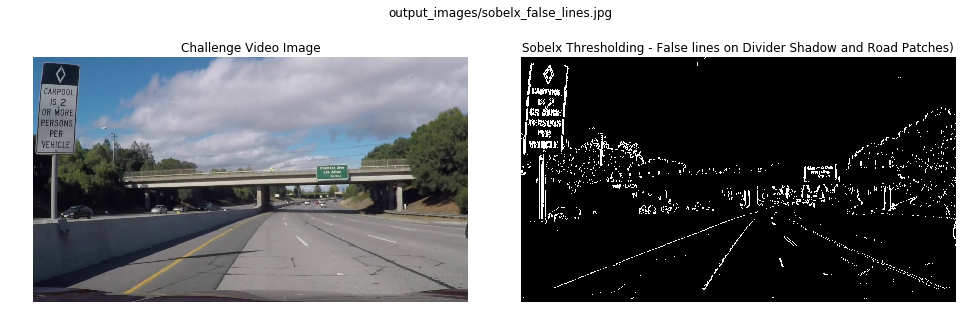

In [10]:
image = plt.imread('./challenge_img_65.jpg')

# Extract l-channel only from HLS image
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
l_channel = hls[:,:,1]

# Sobel operation in x direction
sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0, ksize=3)
abs_sobelx = np.absolute(sobelx)
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Threshold x gradient
sx_binary = np.zeros_like(scaled_sobel)
sx_binary[(scaled_sobel >= 20) & (scaled_sobel <= 255)] = 1

# plot, save original and sobelx thresholded image
f, ax = plt.subplots(1, 2, figsize=(14,5));
ax[0].imshow(image); ax[0].set_title('Challenge Video Image', fontsize=12) 
ax[1].imshow(sx_binary, cmap='gray'); ax[1].set_title('Sobelx Thresholding - False lines on Divider Shadow and Road Patches)', fontsize=12)
ax[0].axis('off'); ax[1].axis('off'); 
imgpth = 'output_images/sobelx_false_lines.jpg'
f.suptitle(imgpth)
f.subplots_adjust(top=0.9)
f.tight_layout()
f.savefig(imgpth)

Following cell is the definition of ```mask_color``` function that 
1. Transforming input image from RGB to HLS space
2. Masking based on the input list of color boundaries
3. Thresholding on L-channel

In [11]:
# function default parameters are set for project video
def mask_color(img, 
               hls_boundaries=[([20, 0, 40],[35, 255, 255])],
               l_thresh=(205,255)):
    
    img = np.copy(img)
    
    # Convert to HLS color space
    hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # placeholder for hls mask
    hls_mask = np.zeros_like(hls_img[:,:,0], dtype="uint8")
    
    # Loop to mask for every upper-lower boundary pair
    for (lower, upper) in hls_boundaries:
        # create NumPy arrays from the boundaries
        lower = np.array(lower, dtype = "uint8")
        upper = np.array(upper, dtype = "uint8")
        
        # masking using cv2.inRange function
        mask = cv2.inRange(hls_img, lower, upper)
        
        # add the binary to previous binary image
        hls_mask = hls_mask | (mask == 255)
        
    # extract l-channel from hls image
    l_channel = hls_img[:,:,1] 
    
    # l-channel thresholding
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1    
    
    # Bitwise OR on hls masked output and l-channel thresholded output
    combined_binary = (hls_mask | l_binary)
    
    return combined_binary

Codes that apply ```mask_color``` on test images. 

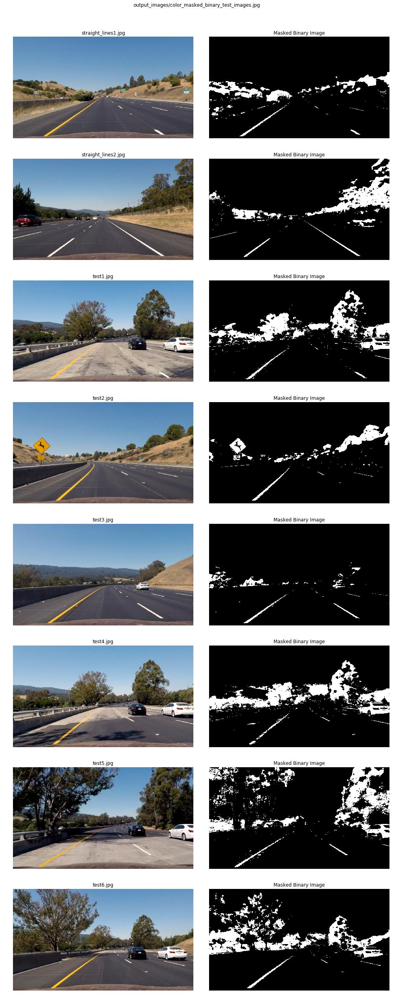

In [12]:
# Get the images collection for processing
test_imgs_dir = './test_images/'
imgpths = sorted(glob.glob(test_imgs_dir + '/*.jpg'))

# Set up plot axes
cols=2
rows=len(imgpths)
f, ax = plt.subplots(rows, cols, figsize=(cols*7, rows*4.5))

if rows > 0:
    for r, pth in enumerate(imgpths):
        # Read in image
        image = plt.imread(pth)
        
        # Apply distortion correction
        undist = cv2.undistort(image, mtx, dist, None, mtx)
        
        # Apply color space transform, sobel transform in x and thresholding
        combined_binary = mask_color(undist)
        
        # plot pre and post masking
        ax[r,0].axis('off'); ax[r,0].set_title(os.path.basename(pth)); 
        ax[r,0].imshow(undist)
        ax[r,1].axis('off'); ax[r,1].set_title('Masked Binary Image'); 
        ax[r,1].imshow(combined_binary, cmap='gray')

# save figure
imgpth = 'output_images/color_masked_binary_test_images.jpg'
f.tight_layout()
f.suptitle(imgpth)
f.subplots_adjust(top=0.95)
f.savefig(imgpth)

---
#### 4. Transform from Single-point Perspective to Aerial view

In [13]:
apex = [image.shape[1]/2, image.shape[0]/2]
trapezoid_ul = [apex[0]-45, apex[1]+90]
trapezoid_ur = [apex[0]+45, apex[1]+90]
trapezoid_lr = [image.shape[1]-170, image.shape[0]]
trapezoid_ll = [210, image.shape[0]]

bbox_ul = [image.shape[1]/4, 0]
bbox_ur = [image.shape[1]*3/4, 0]
bbox_ll = [image.shape[1]/4, image.shape[0]]
bbox_lr = [image.shape[1]*3/4, image.shape[0]]

# default parameters are tuned for project variables
def transform_aerial_view(img,  
                          trapeziod_vertices = [trapezoid_ul, trapezoid_ur, trapezoid_lr, trapezoid_ll],
                          aerial_vertices = [bbox_ul, bbox_ur, bbox_lr, bbox_ll]):
    
    image = np.copy(img)
    
    # Convert list of src and dst vertices into np float array
    src = np.asarray(trapeziod_vertices, dtype= np.float32)
    dst = np.asarray(aerial_vertices, dtype= np.float32)

    # Compute transformation matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Apply transformation matrix to input image
    warped = cv2.warpPerspective(image, M, (img.shape[1],img.shape[0]),flags=cv2.INTER_LINEAR)

    return warped

Following is the application of ```transform_aerial_view``` on binary thresholded test images.

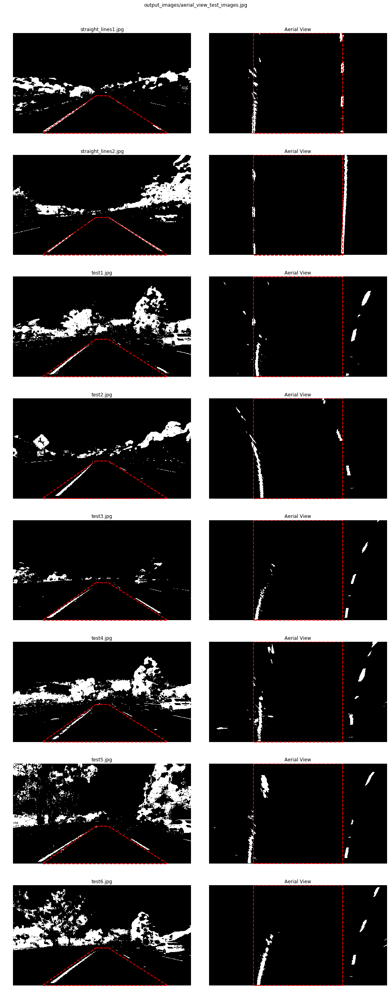

In [14]:
# Make a list of image paths
test_imgs_dir = './test_images/'
imgpths = sorted(glob.glob(test_imgs_dir + '/*.jpg'))

# Set up plot axes
cols=2
rows=len(imgpths)
f, ax = plt.subplots(rows, cols, figsize=(cols*7, rows*4.5))

if rows > 0:
    for r, pth in enumerate(imgpths):
        # Read in image
        image = plt.imread(pth)
        
        # Apply distortion correction
        undist = cv2.undistort(image, mtx, dist, None, mtx)
        
        # Apply color space transform and thresholding
        combined_binary = mask_color(undist)
        
        # Transform from Perspective to bird eye view
        binary_warped = transform_aerial_view(combined_binary)

        # make trapezoid and bbox vertices for plot marker
        apex = [image.shape[1]/2, image.shape[0]/2]
        trapezoid_ul = [apex[0]-45, apex[1]+90]
        trapezoid_ur = [apex[0]+45, apex[1]+90]
        trapezoid_lr = [image.shape[1]-170, image.shape[0]]
        trapezoid_ll = [210, image.shape[0]]

        bbox_ul = [image.shape[1]/4, 0]
        bbox_ur = [image.shape[1]*3/4, 0]
        bbox_ll = [image.shape[1]/4, image.shape[0]]
        bbox_lr = [image.shape[1]*3/4, image.shape[0]]
        
        # plot single-point perspective and mark trapezoid
        ax[r,0].axis('off'); ax[r,0].set_title(os.path.basename(pth)); 
        ax[r,0].imshow(combined_binary, cmap='gray')
        x = [trapezoid_ul[0], trapezoid_ur[0], trapezoid_lr[0], trapezoid_ll[0], trapezoid_ul[0]]
        y = [trapezoid_ul[1], trapezoid_ur[1], trapezoid_lr[1], trapezoid_ll[1], trapezoid_ul[1]]
        ax[r,0].plot(x, y, 'r--', lw=2)
        
        # plot aeriel view and mark warped destination reference
        ax[r,1].axis('off'); ax[r,1].set_title('Aerial View'); 
        ax[r,1].imshow(binary_warped, cmap='gray')
        x = [bbox_ul[0], bbox_ur[0], bbox_lr[0], bbox_ll[0], bbox_ul[0]]
        y = [bbox_ul[1], bbox_ur[1], bbox_lr[1], bbox_ll[1], bbox_ul[1]]
        ax[r,1].plot(x, y, 'r--', lw=2)

# Save figure
imgpth = 'output_images/aerial_view_test_images.jpg'
f.tight_layout()
f.suptitle(imgpth)
f.subplots_adjust(top=0.95)
f.savefig(imgpth)

#### 5. Lane Detection and Fitting
Detect lane pixels and fit to find the lane boundary.

In [20]:
def detect_and_fit_lane(binary_warped, left_fit=None,right_fit=None):
    # Identify the x and y positions of all nonzero pixels in the image
    nonzeroy, nonzerox = binary_warped.nonzero()
    
    # Set the width of the windows +/- margin
    margin = 100
    
    # Set minimum number of pixels found to recenter window
    minpix = 50    
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
        
    # None for both left and right fit is the value
    # to perform a new sliding window search (histogram-based)
    # scenarios such as:
    #     first frame of the video or
    #     when a consecutive drop of bad fitting
    if left_fit is None and right_fit is None:
        
        # compute histogram along all the columns in the lower half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
        
        # Find the peak of the left and right halves of the histogram
        # as the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)

        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
  
        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin

            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                              (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                               (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            # If you found > minpix pixels, 
            # recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
   
    else:
        # When the function is provided with with left and right fit coeefficient
        # no sliding window search is performed, the function performs targeted
        # search around the fitted line coordinates
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each line
    if len(leftx) == 0:
        left_fit = None
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
    
    if len(rightx) == 0:
        right_fit = None
    else:
        right_fit = np.polyfit(righty, rightx, 2)

    return left_fit, right_fit, (leftx, lefty), (rightx, righty)

---
#### 6. Lane Curvature and Vehicle Position
Determine the curvature of the lane and vehicle position with respect to center.

In [21]:
def compute_lane_curvature(left_fit, right_fit):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/900 # meters per pixel in x dimension

    # Construct all x,y for left and right boundary
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Convert to meter units and Fit new polynomials 
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # generate a vector of y pixels for calulation
    y_eval = np.linspace(0, image.shape[0]-1, image.shape[0])
    
    # Calculate the new radii of curvature in meters
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Calculate the vehicle offset to the center of lane
    lane_centerx = right_fitx[-1] - left_fitx[-1]
    vehicle_offset = (640 - lane_centerx) * xm_per_pix
    
    # return the mean radius and vehicle offset to the center of the lane
    return left_curverad.mean(), right_curverad.mean(), vehicle_offset

#### 7. Warping lane boundaries and Final Visualization

```mark_lane``` function definition

In [22]:
def mark_lane(binary_warped, 
              left_fit, right_fit, 
              left_lane, right_lane, 
              left_detected=True, right_detected=True):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # create image of RGB space
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # color non-zero pixels of left line with red
    out_img[left_lane[1], left_lane[0]] = [255, 0, 0]
    # color non-zero pixels of right line with blue
    out_img[right_lane[1], right_lane[0]] = [0, 0, 255]
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    margin = 100
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw fitted left and right line in yellow
    out_img[ploty[left_fitx < out_img.shape[1]].astype('int'),
               left_fitx[left_fitx < out_img.shape[1]].astype('int')] = [255,255,0]
    
    out_img[ploty[right_fitx < out_img.shape[1]].astype('int'),
               right_fitx[right_fitx < out_img.shape[1]].astype('int')] = [255,255,0]
    
    # Draw the lane onto the warped blank image
    window_img = np.zeros_like(out_img)
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (int(not(left_detected))*255,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (int(not(right_detected))*255,255, 0))
    
    # Blending the lane boundary image and detected pixel image
    marked = cv2.addWeighted(out_img, 1, window_img, 0.4, 0)
    return marked

Function definition of ```tranform_single_point_perspective```

In [23]:
# Establish function default parameter values
apex = [image.shape[1]/2, image.shape[0]/2]
trapezoid_ul = [apex[0]-45, apex[1]+90]
trapezoid_ur = [apex[0]+45, apex[1]+90]
trapezoid_lr = [image.shape[1]-170, image.shape[0]]
trapezoid_ll = [210, image.shape[0]]

bbox_ul = [image.shape[1]/4, 0]
bbox_ur = [image.shape[1]*3/4, 0]
bbox_ll = [image.shape[1]/4, image.shape[0]]
bbox_lr = [image.shape[1]*3/4, image.shape[0]]

def transform_single_point_perspective(
        img, left_fit, right_fit, left_lane, right_lane,
        trapeziod_vertices = [trapezoid_ul, trapezoid_ur, trapezoid_lr, trapezoid_ll],
        aerial_vertices = [bbox_ul, bbox_ur, bbox_lr, bbox_ll]):
    
    image = np.copy(img)

    # Generate x and y values for plotting
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # src and dst vertices as np float array
    dst = np.asarray(trapeziod_vertices, dtype= np.float32)
    src = np.asarray(aerial_vertices, dtype= np.float32)

    # obtain transformation matrix
    Minv = cv2.getPerspectiveTransform(src, dst)
    
    boundary_warp = np.zeros_like(image).astype(np.uint8)
    # color non-zero windows on left line
    boundary_warp[left_lane[1], left_lane[0]] = [255, 0, 0]
    # color non-zero windows on right line
    boundary_warp[right_lane[1], right_lane[0]] = [0, 0, 255]
    
    # Warp the nonzero pixel to original image space using inverse perspective matrix (Minv)
    bwarp = cv2.warpPerspective(boundary_warp, Minv, (image.shape[1], image.shape[0])) 
    
    # Formation of color-filled lane
    color_warp = np.zeros_like(image).astype(np.uint8)
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Fill lane as green onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    lwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
      
    # Combine the result with the original image
    lane_warped = cv2.addWeighted(image, 1, lwarp, 0.3, 0)
    lane_warped = cv2.addWeighted(lane_warped, 1, bwarp, 1, 0)
    return lane_warped

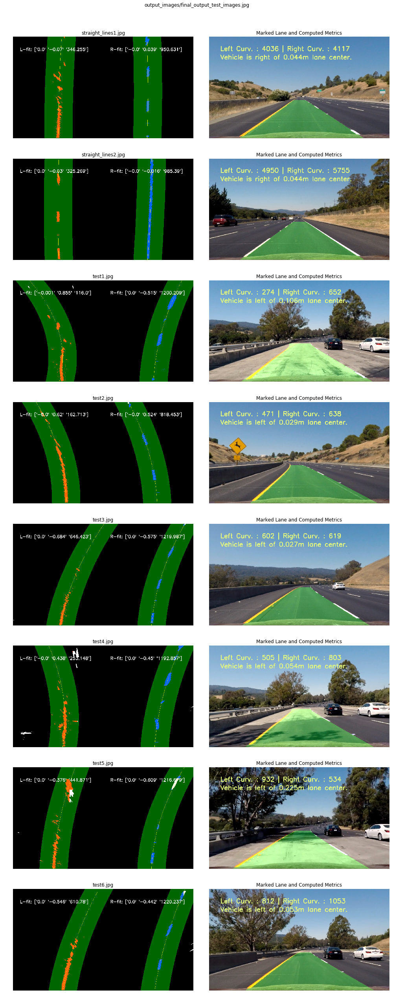

In [25]:
test_imgs_dir = './test_images/'
imgpths = sorted(glob.glob(test_imgs_dir + '/*.jpg'))

cols=2
rows=len(imgpths)

f, ax = plt.subplots(rows, cols, figsize=(cols*7, rows*4.5))

if rows > 0:
    for r, pth in enumerate(imgpths):
        # Read in sample image
        image = plt.imread(pth)
        
        # Apply distortion correction
        undist = cv2.undistort(image, mtx, dist, None, mtx)
        
        # Apply color space transform, sobel transform in x and thresholding
        combined_binary = mask_color(undist)
        
        # Perspective to bird eye view
        warped = transform_aerial_view(undist)
        binary_warped = transform_aerial_view(combined_binary)

        left_fit, right_fit, left_lane, right_lane = detect_and_fit_lane(binary_warped)
        marked = mark_lane(binary_warped, left_fit, right_fit, left_lane, right_lane)
        
        # Print the right and left fitted coeefficient on the image
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(marked,'L-fit: ' + str(np.round(left_fit,3).astype(str)), 
                    (50,100), font,1 ,(255,255,255), 2 , cv2.LINE_AA)
        cv2.putText(marked,'R-fit: ' + str(np.round(right_fit,3).astype(str)), 
                    (690,100), font,1 ,(255,255,255), 2 , cv2.LINE_AA)

        l_rad, r_rad, vehicle_pos = compute_lane_curvature(left_fit, right_fit)

        lane_warped = transform_single_point_perspective(
                    undist, left_fit, right_fit, left_lane, right_lane)
        
        cv2.putText(lane_warped,'Left Curv. : ' + str(int(l_rad)) + \
                    ' | Right Curv. : ' + str(int(r_rad)), 
                    (80,100), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)

        if vehicle_pos < 0:
            cv2.putText(lane_warped,'Vehicle is left of ' + str(np.round(np.absolute(vehicle_pos),3)) + \
                        'm lane center.', (80,160), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)
        else:
            cv2.putText(lane_warped,'Vehicle is right of ' + str(np.round(np.absolute(vehicle_pos),3)) + \
                        'm lane center.', (80,160), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)

        ax[r,0].axis('off'); ax[r,0].set_title(os.path.basename(pth)); 
        ax[r,0].imshow(marked, cmap='gray')
        
        ax[r,1].axis('off'); ax[r,1].set_title('Marked Lane and Computed Metrics'); 
        ax[r,1].imshow(lane_warped, cmap='gray')
        
imgpth = 'output_images/final_output_test_images.jpg'
f.tight_layout()
f.suptitle(imgpth)
f.subplots_adjust(top=0.95)
f.savefig(imgpth)

** Visualization of the series of processing in the pipeline **

In [27]:
def visualize_pipeline(outputset, figname):
    image, undist, warped, combined_binary, binary_warped, lane_warped, marked = outputset

    cols=2
    rows=4

    fig, ax = plt.subplots(rows, cols, figsize=(cols*8, rows*4.5))

    apex = [image.shape[1]/2, image.shape[0]/2]
    trapezoid_ul = [apex[0]-45, apex[1]+90]
    trapezoid_ur = [apex[0]+45, apex[1]+90]
    trapezoid_lr = [image.shape[1]-170, image.shape[0]]
    trapezoid_ll = [210, image.shape[0]]

    bbox_ul = [image.shape[1]/4, 0]
    bbox_ur = [image.shape[1]*3/4, 0]
    bbox_ll = [image.shape[1]/4, image.shape[0]]
    bbox_lr = [image.shape[1]*3/4, image.shape[0]]

    ax[0,0].imshow(image)
    ax[0,0].axis('off')
    ax[0,0].set_title('Raw Image')

    ax[0,1].imshow(undist)
    ax[0,1].axis('off')
    ax[0,1].set_title('Distortion Correction')

    ax[1,0].imshow(undist)
    ax[1,0].axis('off')
    ax[1,0].set_title('Perspective Trapezoid')
    x = [trapezoid_ul[0], trapezoid_ur[0], trapezoid_lr[0], trapezoid_ll[0], trapezoid_ul[0]]
    y = [trapezoid_ul[1], trapezoid_ur[1], trapezoid_lr[1], trapezoid_ll[1], trapezoid_ul[1]]
    ax[1,0].plot(x, y, 'r--', lw=2)

    ax[1,1].imshow(warped)
    ax[1,1].axis('off')
    ax[1,1].set_title('Bird-Eye View')
    x = [bbox_ul[0], bbox_ur[0], bbox_lr[0], bbox_ll[0], bbox_ul[0]]
    y = [bbox_ul[1], bbox_ur[1], bbox_lr[1], bbox_ll[1], bbox_ul[1]]
    ax[1,1].plot(x, y, 'r--', lw=2)

    ax[2,0].imshow(combined_binary, cmap='gray')
    ax[2,0].axis('off')
    ax[2,0].set_title('Binary Thresholded')
    x = [trapezoid_ul[0], trapezoid_ur[0], trapezoid_lr[0], trapezoid_ll[0], trapezoid_ul[0]]
    y = [trapezoid_ul[1], trapezoid_ur[1], trapezoid_lr[1], trapezoid_ll[1], trapezoid_ul[1]]
    ax[2,0].plot(x, y, 'r--', lw=2)

    ax[2,1].imshow(binary_warped, cmap='gray')
    ax[2,1].axis('off')
    ax[2,1].set_title('Bird-Eye View')
    x = [bbox_ul[0], bbox_ur[0], bbox_lr[0], bbox_ll[0], bbox_ul[0]]
    y = [bbox_ul[1], bbox_ur[1], bbox_lr[1], bbox_ll[1], bbox_ul[1]]
    ax[2,1].plot(x, y, 'r--', lw=2)

    ax[3,0].imshow(lane_warped, cmap='gray')
    ax[3,0].axis('off')
    ax[3,0].set_title('Marked Lane with Computed Radii and Metrics')

    ax[3,1].imshow(marked, cmap='gray')
    ax[3,1].axis('off')
    ax[3,1].set_title('Lane Detection and Line Fitting')
    
    fig.suptitle(figname, fontsize=20)
    fig.savefig(figname)

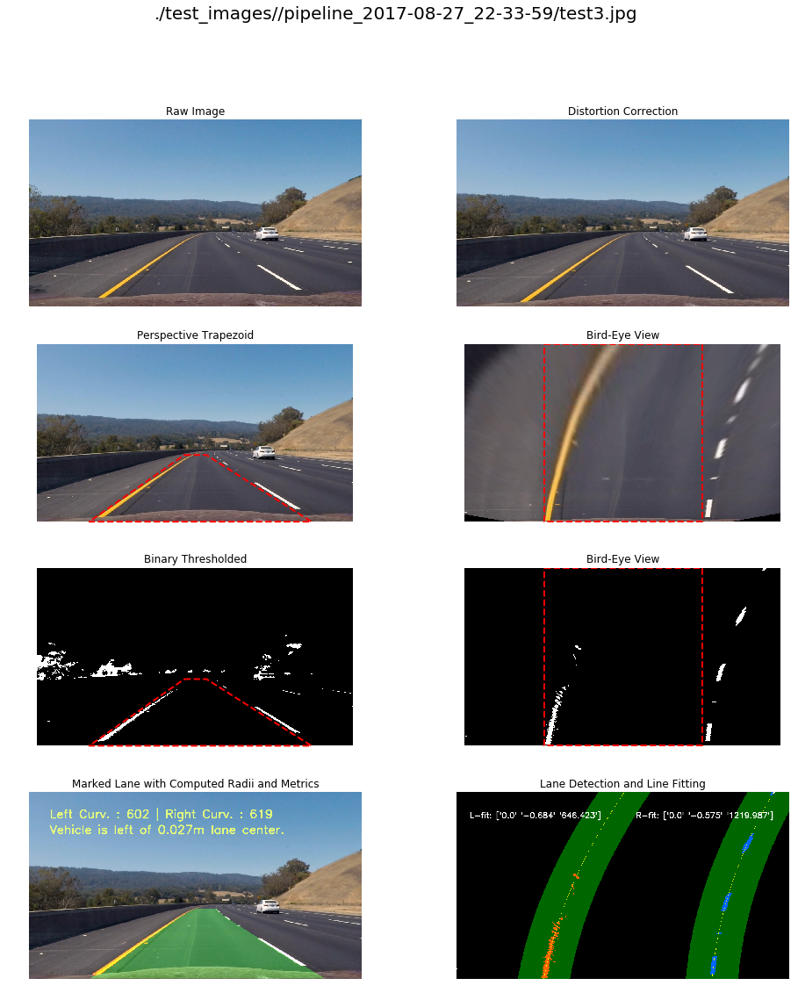

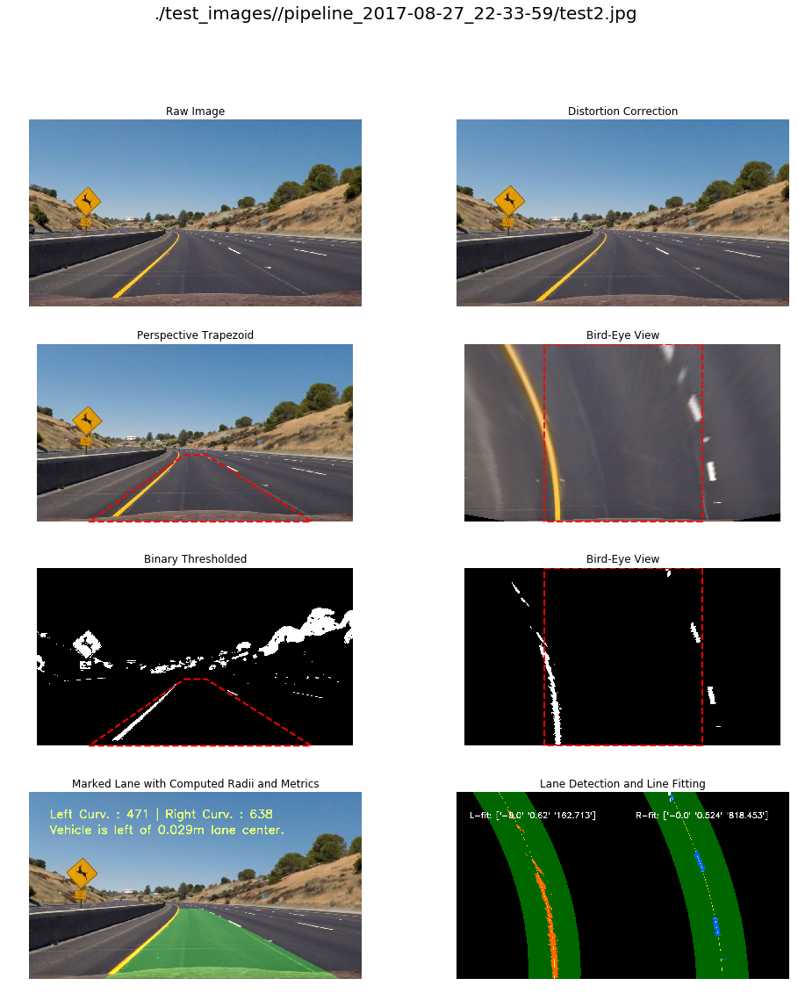

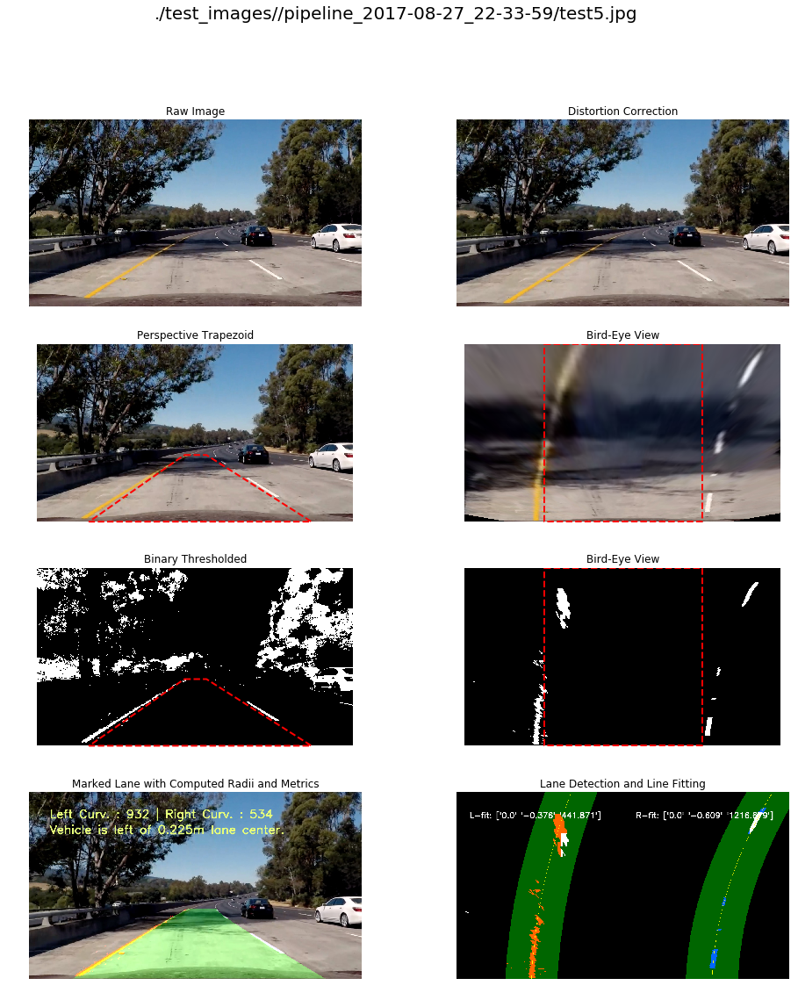

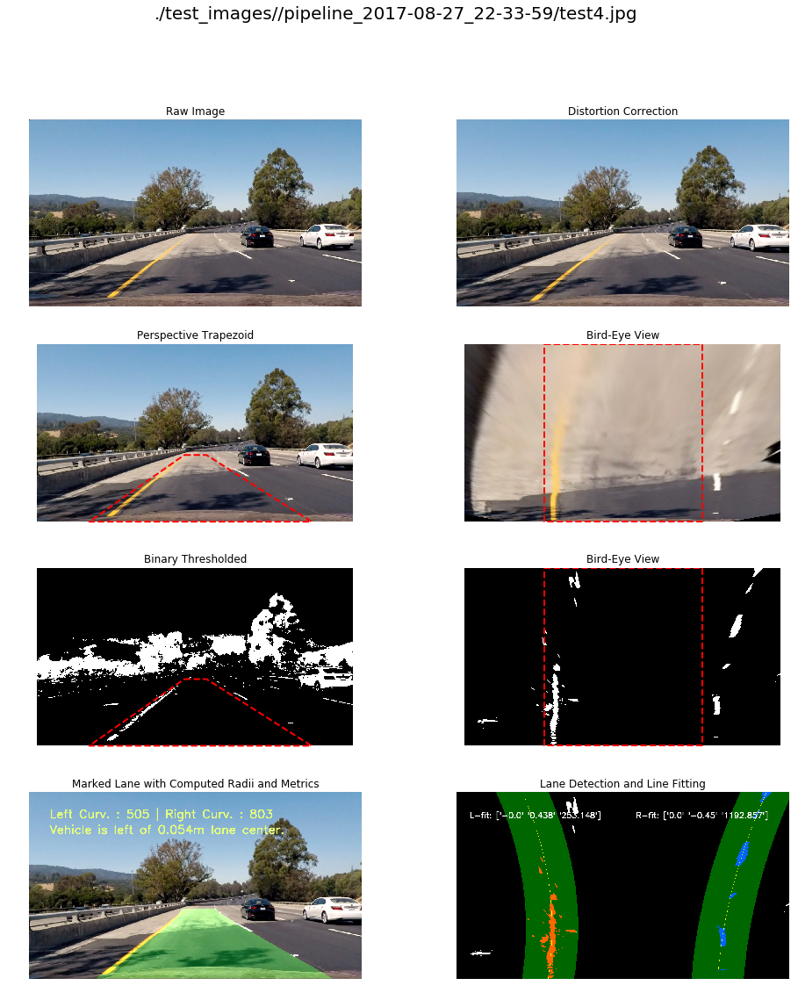

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


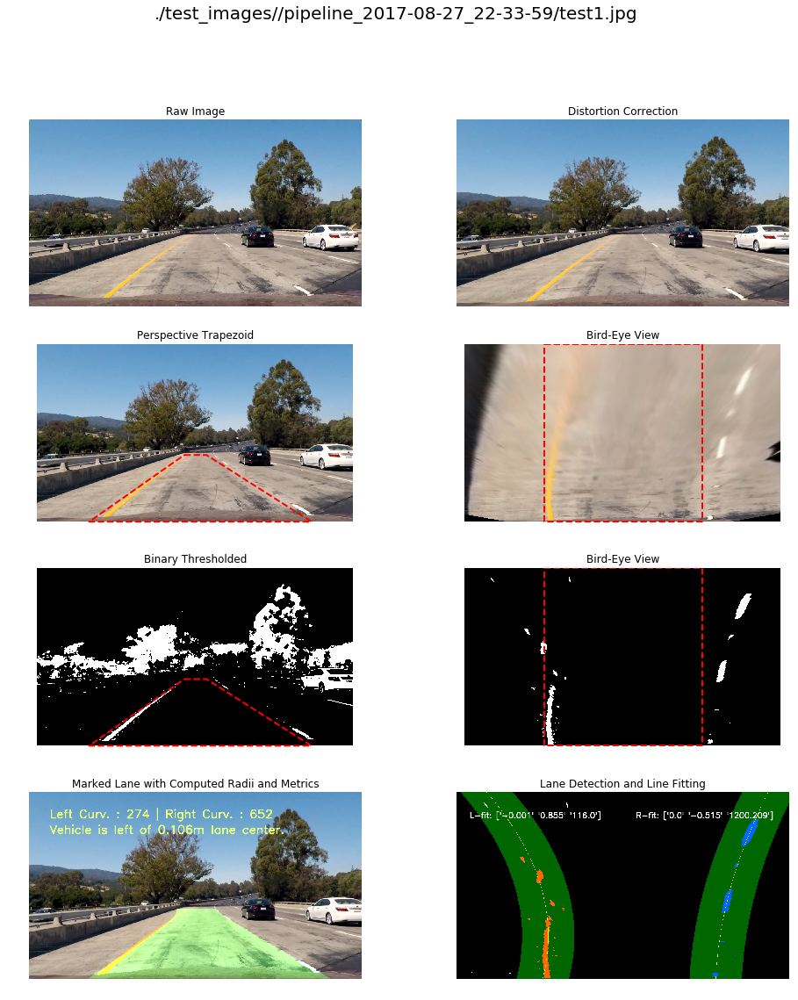

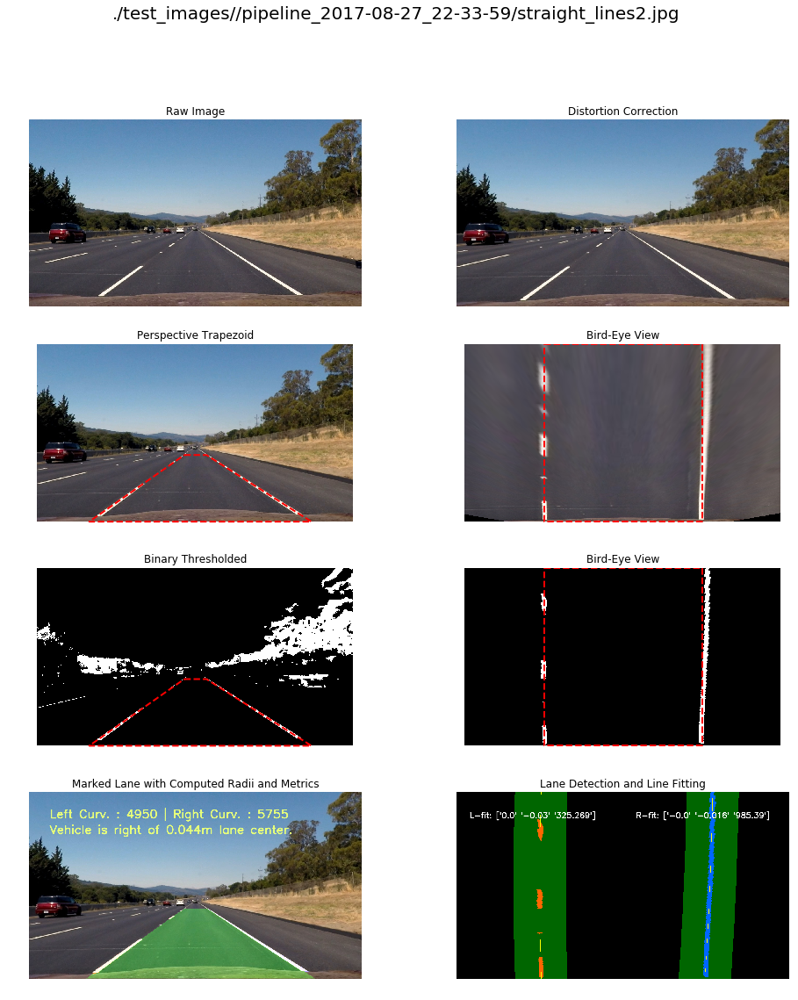

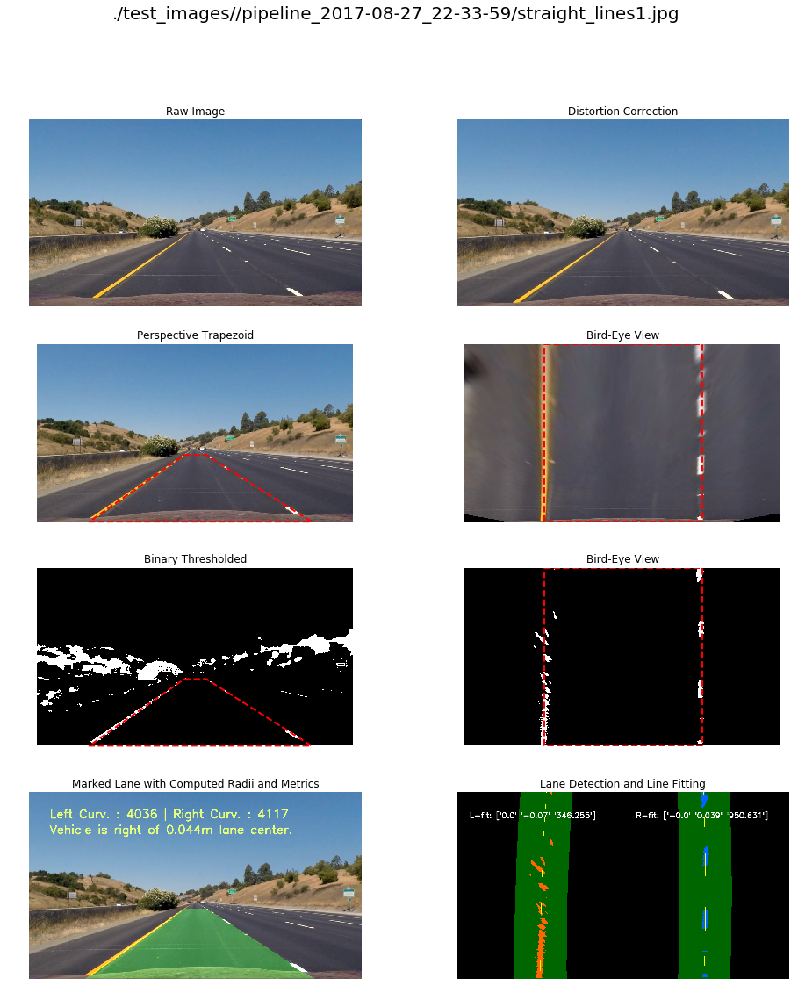

In [28]:
import os
from datetime import datetime

test_images_folder = './test_images/'
imagepaths = glob.glob('./test_images/' + '*.jpg')

if len(imagepaths) > 0:
    new_folder = test_images_folder + \
                    "/pipeline_" + \
                    datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
    
    os.makedirs(new_folder)
    for path in imagepaths:
        figpath = new_folder + '/' + path.split('/')[-1]
        
        # Read in sample image
        image = plt.imread(path)
        
        # Apply distortion correction
        undist = cv2.undistort(image, mtx, dist, None, mtx)
        
        # Apply color space transform, sobel transform in x and thresholding
        combined_binary = mask_color(undist)
        
        # Perspective to bird eye view
        warped = transform_aerial_view(undist)
        binary_warped = transform_aerial_view(combined_binary)

        left_fit, right_fit, left_lane, right_lane = detect_and_fit_lane(binary_warped)
        marked = mark_lane(binary_warped, left_fit, right_fit, left_lane, right_lane)
        
        # Print the right and left fitted coeefficient on the image
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(marked,'L-fit: ' + str(np.round(left_fit,3).astype(str)), (50,100), font,1 ,(255,255,255), 2 , cv2.LINE_AA)
        cv2.putText(marked,'R-fit: ' + str(np.round(right_fit,3).astype(str)), (690,100), font,1 ,(255,255,255), 2 , cv2.LINE_AA)

        l_rad, r_rad, vehicle_pos = compute_lane_curvature(left_fit, right_fit)

        lane_warped = transform_single_point_perspective(
                    undist, left_fit, right_fit, left_lane, right_lane)
        
        cv2.putText(lane_warped,'Left Curv. : ' + str(int(l_rad)) + \
                    ' | Right Curv. : ' + str(int(r_rad)), 
                    (80,100), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)

        if vehicle_pos < 0:
            cv2.putText(lane_warped,'Vehicle is left of ' + str(np.round(np.absolute(vehicle_pos),3)) + \
                        'm lane center.', (80,160), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)
        else:
            cv2.putText(lane_warped,'Vehicle is right of ' + str(np.round(np.absolute(vehicle_pos),3))+ \
                        'm lane center.', (80,160), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)

        ax[r,0].axis('off'); ax[r,0].set_title(os.path.basename(pth)); 
        ax[r,0].imshow(marked, cmap='gray')
        
        ax[r,1].axis('off'); ax[r,1].set_title('Detected Lane and Computed Metrics'); 
        ax[r,1].imshow(lane_warped, cmap='gray')
        
        outputset = (image, undist, warped, combined_binary, binary_warped, lane_warped, marked)
        visualize_pipeline(outputset, figpath)

#### 8. Final Pipelines for project and challenge videosproject video

In [29]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        
        # storage of fit coefficients of the last n iterations
        self.previous_fits = []
        
        # polynomial coefficients for the most recent fit
        self.current_fit = None  
        
        # radius of curvature of the line in some units
        self.radius = None 
        
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        # x, y of detected line pixels
        self.allxy = (None, None)  
        
        # count of consecutive bad fitting
        self.drop_count = 0

In [32]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import ImageSequenceClip
from IPython.display import HTML
from tqdm import tqdm # progress bar

### Project video pipeline

In [33]:
def process_imgs(srcdir, dstdir):
    raw_imgs= sorted(glob.glob(srcdir + '/*.jpg'))
    
    if not os.path.exists(dstdir):
        os.makedirs(dstdir)
    
    # the number of historical fit to be stored
    smoothing_factor = 12
    
    # the number of consecutive drop threshold to initiate new search
    window_reset_threshold = 3

    # change threshold to reject a fitting
    linear_coeff_threshold = 0.3
    
    # Instantiate line object for left and right line
    left_line = Line()
    right_line = Line()
 
    for i in tqdm(range(0, len(raw_imgs))):
        # Read in frame
        image = plt.imread(raw_imgs[i])
        
        # Apply distortion correction
        undist = cv2.undistort(image, mtx, dist, None, mtx)

        # Apply color space transform and thresholding
        combined_binary = mask_color(undist)

        # Perspective tranform to aerial view
        warped = transform_aerial_view(undist)
        binary_warped = transform_aerial_view(combined_binary)

        # Lane Detection and fitting
        left_line.current_fit, right_line.current_fit, left_line.allxy, right_line.allxy = \
            detect_and_fit_lane(binary_warped, left_line.best_fit, right_line.best_fit)

        # Sanity Check
        #--------------
        # Compute the difference between the current fit coeff and the best fit coeff
        if i > 0:   
            left_line.diffs = left_line.current_fit - left_line.best_fit
            right_line.diffs = right_line.current_fit - right_line.best_fit
        
        # Drop the current fit and use the previous fit coeef 
        # if the linear coeff is over a specified threshold
        # otherwise, current fit is good to go
        # the number of consecutive drop is recorded
        if np.absolute(left_line.diffs[1]) > linear_coeff_threshold:
            left_line.current_fit = left_line.previous_fits[-1]
            if left_line.detected == False:
                left_line.drop_count += 1
            left_line.detected = False
        else:
            left_line.detected = True
            left_line.drop_count = 0
            
        if np.absolute(right_line.diffs[1]) > linear_coeff_threshold:
            right_line.current_fit = right_line.previous_fits[-1]
            if right_line.detected == False:
                right_line.drop_count += 1
            right_line.detected = False
        else:
            right_line.detected = True
            right_line.drop_count = 0
        
        # When a consecutive of drop has reached the specified threshold
        # a complete new sliding window search is executed.
        if (left_line.drop_count >= window_reset_threshold) | \
           (right_line.drop_count >= window_reset_threshold):
            # reset the drop count
            left_line.drop_count = 0
            right_line.drop_count = 0
            
            # New window search
            left_line.current_fit, right_line.current_fit, left_temp, right_temp = \
                detect_and_fit_lane(binary_warped, None, None)
            
            # There are chances new window search are not usable,
            # previous fit is used instead
            if (left_line.current_fit is None):
                left_line.current_fit = left_line.previous_fits[-1]
            else:
                left_line.allxy = left_temp
                
            if (right_line.current_fit is None):
                right_line.current_fit = right_line.previous_fits[-1]
            else:
                right_line.allxy = right_temp
                
            left_line.detected = True
            right_line.detected = True
            
            # Clear all the historical fit since a new fit is used
            left_line.previous_fits = []
            right_line.previous_fits = []

        # Discard the first element of the history list to 
        # to make room for recent fit coeff.
        if len(left_line.previous_fits) == smoothing_factor:
            left_line.previous_fits.pop(0)
            right_line.previous_fits.pop(0)
        
        # Append recent fit coeff. to the history list
        left_line.previous_fits.append(left_line.current_fit)
        right_line.previous_fits.append(right_line.current_fit)        
        
        # Smooth out the coeff. averaging all the value in history list
        if len(left_line.previous_fits) == 1:
            left_line.best_fit = left_line.previous_fits[0]
            right_line.best_fit = right_line.previous_fits[0]
        else:
            left_line.best_fit = np.vstack(left_line.previous_fits).mean(axis=0)
            right_line.best_fit = np.vstack(right_line.previous_fits).mean(axis=0)
        
        # Get bird-eye view with marked lane
        marked = mark_lane(binary_warped, 
                           left_line.best_fit, right_line.best_fit, 
                           left_line.allxy, right_line.allxy,
                           left_line.detected, right_line.detected)
        
        # Print best fit coeff.
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(marked,'L-fit: ' + str(np.round(left_line.best_fit,3).astype(str)), 
                    (50,100), font,1 ,(255,255,255), 2 , cv2.LINE_AA)
        cv2.putText(marked,'R-fit: ' + str(np.round(right_line.best_fit,3).astype(str)), 
                    (690,100), font,1 ,(255,255,255), 2 , cv2.LINE_AA)

        # Overlay detected lane on perspective image
        lane_warped = transform_single_point_perspective(undist, 
                                                         left_line.current_fit, right_line.current_fit, 
                                                         left_line.allxy, right_line.allxy)

        # Compute lane curvature and vehicle offset
        left_line.radius, right_line.radius, vehicle_pos = \
                        compute_lane_curvature(left_line.current_fit, right_line.current_fit)
        
        # Print radius for left and right line
        cv2.putText(lane_warped,'Left Curv. : ' + str(int(left_line.radius)) + \
                    ' | Right Curv. : ' + str(int(right_line.radius)), 
                    (80,100), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)

        # Print vehicle relative position to lane center
        if vehicle_pos < 0:
            cv2.putText(lane_warped,'Vehicle is left of ' + str(np.round(np.absolute(vehicle_pos),3)) + \
                        'm lane center.', (80,160), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)
        else:
            cv2.putText(lane_warped,'Vehicle is right of ' + str(np.round(np.absolute(vehicle_pos),3)) + \
                        'm lane center.', (80,160), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)
      
        # Create a collage of images as a single frame for final video
        collage = np.zeros([720,1280+427,3],dtype='uint8')
        collage[0:720,0:1280,:] = lane_warped
        collage[0:240,1280:,:] = cv2.cvtColor(cv2.resize(combined_binary, (427, 240), 
                                                         interpolation=cv2.INTER_AREA)*255,
                                              cv2.COLOR_GRAY2RGB)
        collage[240:480,1280:,:] = cv2.resize(marked, (427, 240), interpolation=cv2.INTER_AREA)
        collage[480:720,1280:,:] = cv2.resize(warped, (427, 240), interpolation=cv2.INTER_AREA)
        
        plt.imsave(dstdir + "/" + os.path.basename(raw_imgs[i]), collage, format="jpeg")
    
    # Compile video
    clip = ImageSequenceClip(dstdir, fps=25)
    clip.write_videofile(dstdir + '.mp4')

In [34]:
process_imgs('./project_vid2imgs/', 'final_project_video')

                                                                         
MoviePy: building video file final_project_video.mp4
----------------------------------------

Writing video into final_project_video.mp4
Done writing video in final_project_video.mp4 !                          
Your video is ready !


### Challenge video pipeline

Some parameters are tuned for challenge videos:
1. yellow color boundaries
2. l-channel threshold
3. trapezoid to transform to aerial view
4. wider threshold for linear coefficient change

In [35]:
def process_imgs(srcdir, dstdir):
    raw_imgs= sorted(glob.glob(srcdir + '/*.jpg'))
    
    if not os.path.exists(dstdir):
        os.makedirs(dstdir)
    
    # the number of historical fit to be stored
    smoothing_factor = 12
    
    # the number of consecutive drop threshold to initiate new search
    window_reset_threshold = 3

    # change threshold to reject a fitting
    linear_coeff_threshold = 0.5
    
    # Instantiate line object for left and right line
    left_line = Line()
    right_line = Line()
 
    for i in tqdm(range(0, len(raw_imgs))):
        # Read in frame
        image = plt.imread(raw_imgs[i])
        
        # Apply distortion correction
        undist = cv2.undistort(image, mtx, dist, None, mtx)

        # Apply color space transform and thresholding
        combined_binary = mask_color(undist, 
                                     hls_boundaries=[([15, 0, 40],[35, 255, 255])],
                                     l_thresh=(180,255))

        # Non-default trapezoid - settings tuned for challenge video
        apex = [image.shape[1]/2, image.shape[0]/2]
        trapezoid_ul = [apex[0]-65, apex[1]+105]
        trapezoid_ur = [apex[0]+65, apex[1]+105]
        trapezoid_lr = [image.shape[1]-170, image.shape[0]]
        trapezoid_ll = [210, image.shape[0]]

        bbox_ul = [image.shape[1]/4, 0]
        bbox_ur = [image.shape[1]*3/4, 0]
        bbox_ll = [image.shape[1]/4, image.shape[0]]
        bbox_lr = [image.shape[1]*3/4, image.shape[0]]

        # Perspective to bird eye view
        warped = transform_aerial_view(undist,
                                      trapeziod_vertices = [trapezoid_ul, trapezoid_ur, 
                                                            trapezoid_lr, trapezoid_ll],
                                      aerial_vertices = [bbox_ul, bbox_ur, bbox_lr, bbox_ll])
        
        binary_warped = transform_aerial_view(combined_binary,
                                      trapeziod_vertices = [trapezoid_ul, trapezoid_ur, 
                                                            trapezoid_lr, trapezoid_ll],
                                      aerial_vertices = [bbox_ul, bbox_ur, bbox_lr, bbox_ll])

        # Lane Detection and fitting
        left_line.current_fit, right_line.current_fit, left_line.allxy, right_line.allxy = \
            detect_and_fit_lane(binary_warped, left_line.best_fit, right_line.best_fit)

        # Sanity Check
        #-------------
        # Compute the difference between the current fit coeff and the best fit coeff
        if i > 0:   
            left_line.diffs = left_line.current_fit - left_line.best_fit
            right_line.diffs = right_line.current_fit - right_line.best_fit
        
        # Drop the current fit and use the previous fit coeef 
        # if the linear coeff is over a specified threshold
        # otherwise, current fit is good to go
        # the number of drop is recorded
        if np.absolute(left_line.diffs[1]) > linear_coeff_threshold:
            left_line.current_fit = left_line.previous_fits[-1]
            if left_line.detected == False:
                left_line.drop_count += 1
            left_line.detected = False
        else:
            left_line.detected = True
            left_line.drop_count = 0
            
        if np.absolute(right_line.diffs[1]) > linear_coeff_threshold:
            right_line.current_fit = right_line.previous_fits[-1]
            if right_line.detected == False:
                right_line.drop_count += 1
            right_line.detected = False
        else:
            right_line.detected = True
            right_line.drop_count = 0
        
        # When a consecutive of drop has reached the specified threshold
        # a complete sliding window search is executed.
        if (left_line.drop_count >= window_reset_threshold) | (right_line.drop_count >= window_reset_threshold):
            left_line.drop_count = 0
            right_line.drop_count = 0
            
            left_line.current_fit, right_line.current_fit, left_temp, right_temp = \
                detect_and_fit_lane(binary_warped, None, None)
                
            if (left_line.current_fit is None):
                left_line.current_fit = left_line.previous_fits[-1]
            else:
                left_line.allxy = left_temp
                
            if (right_line.current_fit is None):
                right_line.current_fit = right_line.previous_fits[-1]
            else:
                right_line.allxy = right_temp
                
            left_line.detected = True
            right_line.detected = True
            
            # Clear all the historical fit since a new fit is used
            left_line.previous_fits = []
            right_line.previous_fits = []
                        
        # Discard the first element of the history list to 
        # to make room for recent fit coeff.
        if len(left_line.previous_fits) == smoothing_factor:
            left_line.previous_fits.pop(0)
            right_line.previous_fits.pop(0)
        
        # Append recent fit coeff. to the history list
        left_line.previous_fits.append(left_line.current_fit)
        right_line.previous_fits.append(right_line.current_fit)        
        
        # Smooth out the coeff. averaging all the value in history list
        if len(left_line.previous_fits) == 1:
            left_line.best_fit = left_line.previous_fits[0]
            right_line.best_fit = right_line.previous_fits[0]
        else:
            left_line.best_fit = np.vstack(left_line.previous_fits).mean(axis=0)
            right_line.best_fit = np.vstack(right_line.previous_fits).mean(axis=0)
        
        # Get bird-eye view with marked lane
        marked = mark_lane(binary_warped, 
                           left_line.best_fit, right_line.best_fit, 
                           left_line.allxy, right_line.allxy,
                           left_line.detected, right_line.detected)
        
        # Print best fit coef.
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(marked,'L-fit: ' + str(np.round(left_line.best_fit,3).astype(str)), 
                    (50,100), font,1 ,(255,255,255), 2 , cv2.LINE_AA)
        cv2.putText(marked,'R-fit: ' + str(np.round(right_line.best_fit,3).astype(str)), 
                    (690,100), font,1 ,(255,255,255), 2 , cv2.LINE_AA)

        # Overlay detected lane on perspective image
        lane_warped = transform_single_point_perspective(undist, 
                                                         left_line.current_fit, right_line.current_fit, 
                                                         left_line.allxy, right_line.allxy,
                                      trapeziod_vertices = [trapezoid_ul, trapezoid_ur, 
                                                            trapezoid_lr, trapezoid_ll],
                                      aerial_vertices = [bbox_ul, bbox_ur, bbox_lr, bbox_ll])

        # Compute lane curvature and vehicle offset
        left_line.radius, right_line.radius, vehicle_pos = \
                    compute_lane_curvature(left_line.current_fit, right_line.current_fit)
        
        # Print radius for left and right line
        cv2.putText(lane_warped,'Left Curv. : ' + str(int(left_line.radius)) + \
                    ' | Right Curv. : ' + str(int(right_line.radius)), 
                    (80,100), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)

        # Print vehicle relative position to lane center
        if vehicle_pos < 0:
            cv2.putText(lane_warped,'Vehicle is left of ' + str(np.round(np.absolute(vehicle_pos),3)) + \
                        'm lane center.', (80,160), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)
        else:
            cv2.putText(lane_warped,'Vehicle is right of ' + str(np.round(np.absolute(vehicle_pos),3)) + \
                        'm lane center.', (80,160), font, 1.5 ,(230, 255, 122), 3, cv2.LINE_AA)
      
        # Create a collage of images as a single frame for final video
        collage = np.zeros([720,1280+427,3],dtype='uint8')
        collage[0:720,0:1280,:] = lane_warped
        collage[0:240,1280:,:] = cv2.cvtColor(cv2.resize(combined_binary, (427, 240), 
                                                         interpolation=cv2.INTER_AREA)*255,
                                              cv2.COLOR_GRAY2RGB)
        collage[240:480,1280:,:] = cv2.resize(marked, (427, 240), interpolation=cv2.INTER_AREA)
        collage[480:720,1280:,:] = cv2.resize(warped, (427, 240), interpolation=cv2.INTER_AREA)
        
        plt.imsave(dstdir + "/" + os.path.basename(raw_imgs[i]), collage, format="jpeg")

    # Compile video
    clip = ImageSequenceClip(dstdir, fps=25)
    clip.write_videofile(dstdir + '.mp4')

In [37]:
process_imgs('./challenge_vid2imgs/', 'final_challenge_video')

                                                                       
MoviePy: building video file final_challenge_video.mp4
----------------------------------------

Writing video into final_challenge_video.mp4
Done writing video in final_challenge_video.mp4 !                      
Your video is ready !
